In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df=pd.read_excel("air cargo supplychain.xlsx")
df

,Shipment ID,Origin Airport,Destination Airport,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Mode of Transport,Carrier Name,Transit Time (hours),Temperature-Sensitive,Perishable Goods,Customs Clearance Time (hours),Weather Conditions,Day of Week,Delay Status
0,SHIP000001,SFO,LHR,655.03,7.80,1238.23,Air,UPS,16,No,Yes,7,Clear,Thursday,Delayed
1,SHIP000002,ATL,SIN,988.60,37.41,1868.80,Air,Lufthansa Cargo,21,No,No,5,Clear,Thursday,On-Time
2,SHIP000003,DFW,HKG,637.71,10.53,1205.49,Air,FedEx,6,No,No,36,Clear,Wednesday,On-Time
3,SHIP000004,SFO,DXB,367.47,7.70,694.65,Rail,DHL,17,Yes,No,16,Rainy,Sunday,On-Time
4,SHIP000005,ORD,HKG,671.23,3.59,1268.86,Air,DHL,36,No,No,3,Rainy,Friday,Delayed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,SHIP019996,ATL,DXB,158.99,10.97,300.55,Air,UPS,36,Yes,Yes,32,Clear,Monday,Delayed
19996,SHIP019997,MIA,NRT,655.74,42.92,1239.58,Air,FedEx,46,Yes,No,28,Foggy,Friday,On-Time
19997,SHIP019998,LAX,LHR,711.80,29.54,1345.55,Air,UPS,30,Yes,No,16,Clear,Monday,On-Time
19998,SHIP019999,DFW,HKG,147.04,4.38,277.96,Rail,FedEx,16,No,No,19,Clear,Thursday,On-Time


In [3]:
df.shape

(20000, 15)

In [4]:
df.isnull().sum()

Shipment ID                       0
Origin Airport                    0
Destination Airport               0
Shipment Weight (kg)              0
Shipment Volume (m³)              0
Freight Cost (USD)                0
Mode of Transport                 0
Carrier Name                      0
Transit Time (hours)              0
Temperature-Sensitive             0
Perishable Goods                  0
Customs Clearance Time (hours)    0
Weather Conditions                0
Day of Week                       0
Delay Status                      0
dtype: int64

In [5]:
# Check for duplicate rows
print("Duplicate Rows:", df.duplicated().sum())

# Drop duplicates if necessary
df = df.drop_duplicates()


Duplicate Rows: 0


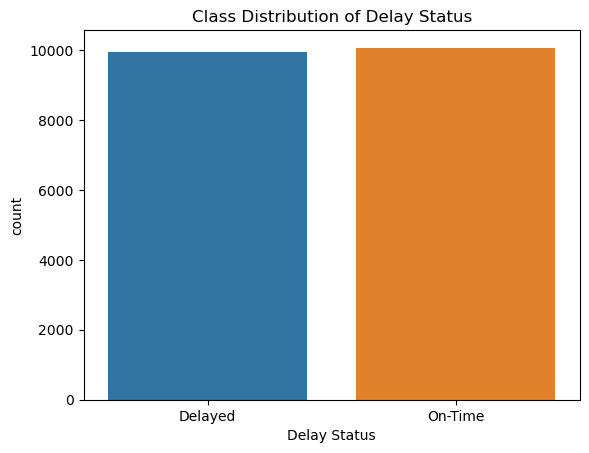

Delay Status
On-Time    0.50325
Delayed    0.49675
Name: proportion, dtype: float64


In [6]:
# Check class distribution
sns.countplot(x="Delay Status", data=df)
plt.title("Class Distribution of Delay Status")
plt.show()

# Print value counts
print(df["Delay Status"].value_counts(normalize=True))


In [7]:
df.dtypes

Shipment ID                        object
Origin Airport                     object
Destination Airport                object
Shipment Weight (kg)              float64
Shipment Volume (m³)              float64
Freight Cost (USD)                float64
Mode of Transport                  object
Carrier Name                       object
Transit Time (hours)                int64
Temperature-Sensitive              object
Perishable Goods                   object
Customs Clearance Time (hours)      int64
Weather Conditions                 object
Day of Week                        object
Delay Status                       object
dtype: object

In [8]:
df.nunique()

Shipment ID                       20000
Origin Airport                        7
Destination Airport                   7
Shipment Weight (kg)              18158
Shipment Volume (m³)               4898
Freight Cost (USD)                18158
Mode of Transport                     3
Carrier Name                          5
Transit Time (hours)                 67
Temperature-Sensitive                 2
Perishable Goods                      2
Customs Clearance Time (hours)       47
Weather Conditions                    4
Day of Week                           7
Delay Status                          2
dtype: int64

Encoding

In [9]:
df

,Shipment ID,Origin Airport,Destination Airport,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Mode of Transport,Carrier Name,Transit Time (hours),Temperature-Sensitive,Perishable Goods,Customs Clearance Time (hours),Weather Conditions,Day of Week,Delay Status
0,SHIP000001,SFO,LHR,655.03,7.80,1238.23,Air,UPS,16,No,Yes,7,Clear,Thursday,Delayed
1,SHIP000002,ATL,SIN,988.60,37.41,1868.80,Air,Lufthansa Cargo,21,No,No,5,Clear,Thursday,On-Time
2,SHIP000003,DFW,HKG,637.71,10.53,1205.49,Air,FedEx,6,No,No,36,Clear,Wednesday,On-Time
3,SHIP000004,SFO,DXB,367.47,7.70,694.65,Rail,DHL,17,Yes,No,16,Rainy,Sunday,On-Time
4,SHIP000005,ORD,HKG,671.23,3.59,1268.86,Air,DHL,36,No,No,3,Rainy,Friday,Delayed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,SHIP019996,ATL,DXB,158.99,10.97,300.55,Air,UPS,36,Yes,Yes,32,Clear,Monday,Delayed
19996,SHIP019997,MIA,NRT,655.74,42.92,1239.58,Air,FedEx,46,Yes,No,28,Foggy,Friday,On-Time
19997,SHIP019998,LAX,LHR,711.80,29.54,1345.55,Air,UPS,30,Yes,No,16,Clear,Monday,On-Time
19998,SHIP019999,DFW,HKG,147.04,4.38,277.96,Rail,FedEx,16,No,No,19,Clear,Thursday,On-Time


In [10]:
df.dtypes

Shipment ID                        object
Origin Airport                     object
Destination Airport                object
Shipment Weight (kg)              float64
Shipment Volume (m³)              float64
Freight Cost (USD)                float64
Mode of Transport                  object
Carrier Name                       object
Transit Time (hours)                int64
Temperature-Sensitive              object
Perishable Goods                   object
Customs Clearance Time (hours)      int64
Weather Conditions                 object
Day of Week                        object
Delay Status                       object
dtype: object

In [11]:
# Crosstab for categorical features vs Delay Status
categorical_features = ['Mode of Transport', 'Carrier Name', 'Temperature-Sensitive',
                        'Perishable Goods', 'Weather Conditions', 'Day of Week','Origin Airport',
                      'Destination Airport' ]

for feature in categorical_features:
    table = pd.crosstab(df[feature], df['Delay Status'])
    print(f"\nCrosstab for {feature} vs Delay Status:\n", table)


Crosstab for Mode of Transport vs Delay Status:
 Delay Status       Delayed  On-Time
Mode of Transport                  
Air                   6983     7002
Rail                  1433     1532
Truck                 1519     1531

Crosstab for Carrier Name vs Delay Status:
 Delay Status     Delayed  On-Time
Carrier Name                     
DHL                 1996     1974
Emirates Cargo      2018     2018
FedEx               1972     2003
Lufthansa Cargo     2017     2075
UPS                 1932     1995

Crosstab for Temperature-Sensitive vs Delay Status:
 Delay Status           Delayed  On-Time
Temperature-Sensitive                  
No                        6916     7079
Yes                       3019     2986

Crosstab for Perishable Goods vs Delay Status:
 Delay Status      Delayed  On-Time
Perishable Goods                  
No                   7985     8050
Yes                  1950     2015

Crosstab for Weather Conditions vs Delay Status:
 Delay Status        Delayed  On-T

Intrepretation:
1.Mode of Transport: Air transport has the highest number of delays (6983), likely due to weather disruptions and airport congestion. Rail (1433) and Truck (1519) show fewer delays, indicating more predictable schedules.

2.Carrier Name: All carriers have similar delay and on-time ratios, meaning delays are more inflenced by external factors (weather, customs) rather than carrier efficiency.\

3.Temperature-sensitive shipments face a slightly higher delay risk, while non-sensitive shipments experience fewer delays and more on-time deliveries.

4.Non-Perishable Goods do not have a significant delay issue but Perishable Goods shows a slightly higher proportional delay risk, likely due to strict handling and storage requirements.

5.Clear: Delays and on-time are nearly equal, meaning minimal impact on delays.
Foggy: Slightly more on-time than delayed, suggesting less disruption than expected.
Rainy: Delays and on-time are balanced, meaning rain does not significantly impact shipments.
Stormy: Almost equal delays and on-time, indicating that stormy weather does not drastically increase delays.

6.Tuesday and Wednesday have slightly higher delays due to midweek operational congestion.
7.Delays across airports are similar, but slight differences may be due to airport capacity, operational efficiency, and flight traffic management.but ATL (1464 delays) and SIN (1492 delays) show slightly higher delays,

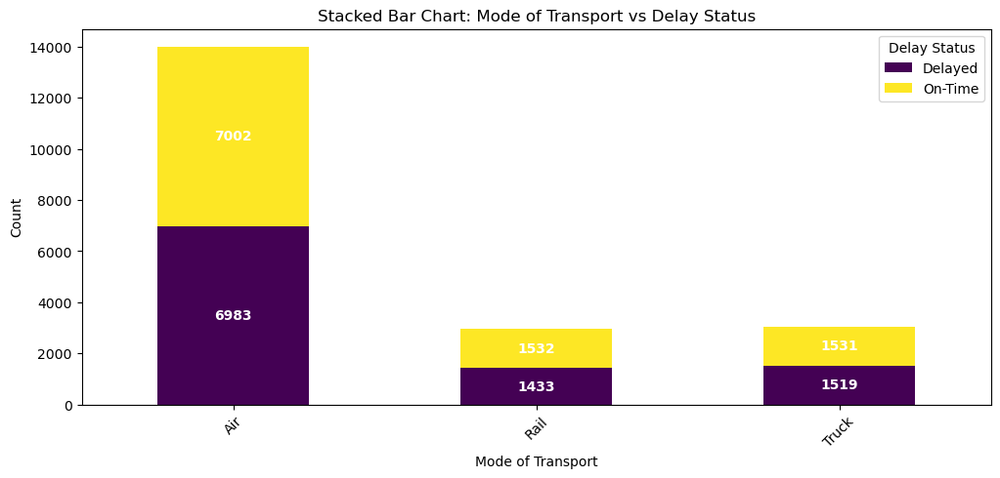

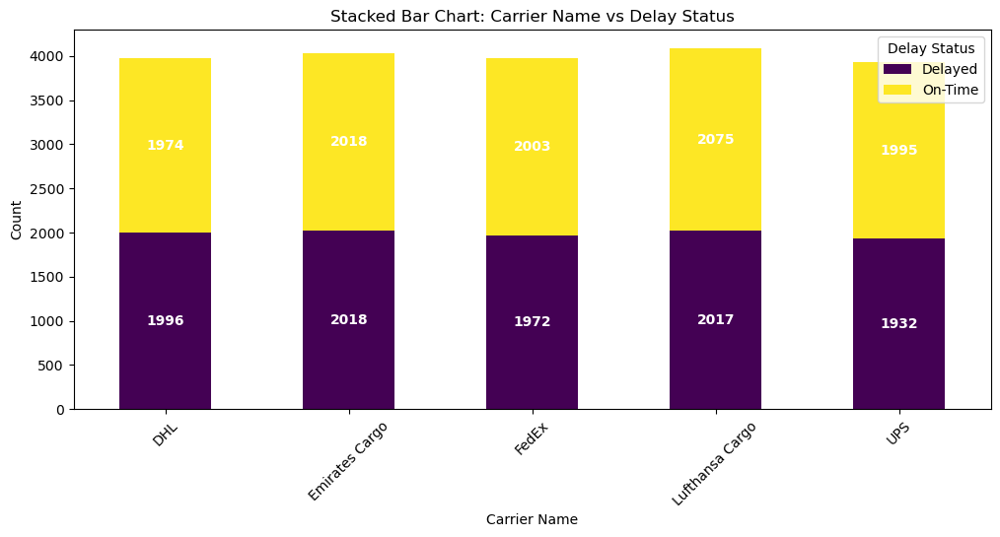

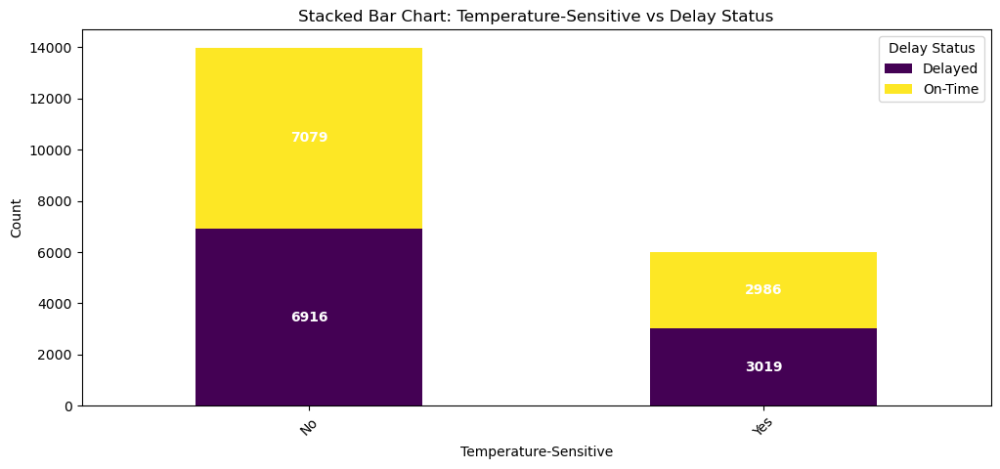

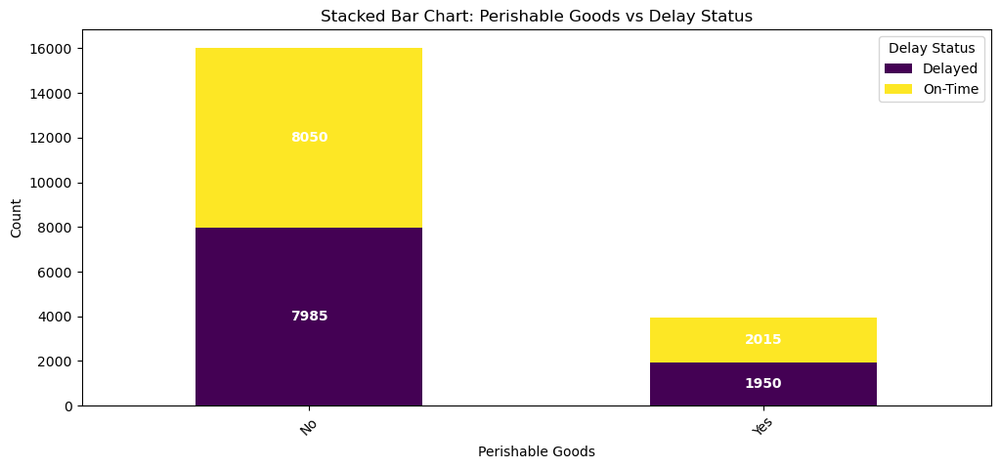

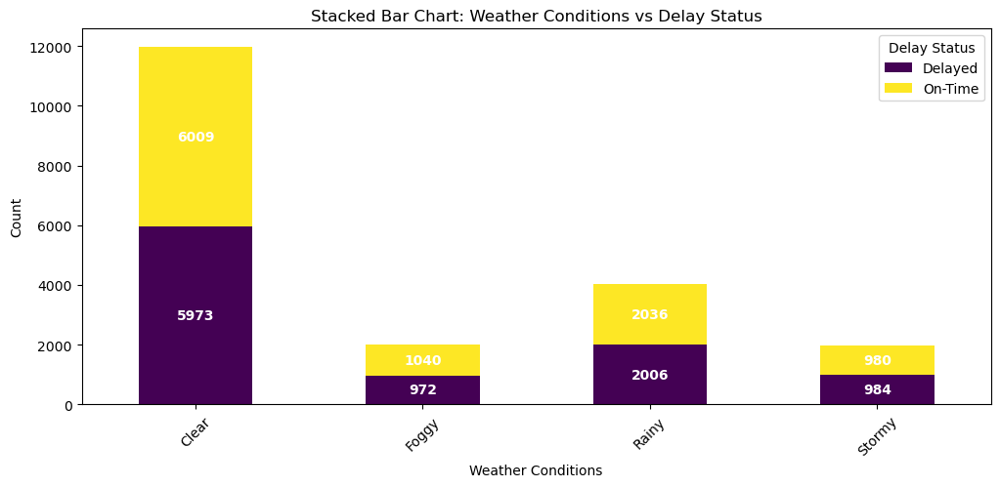

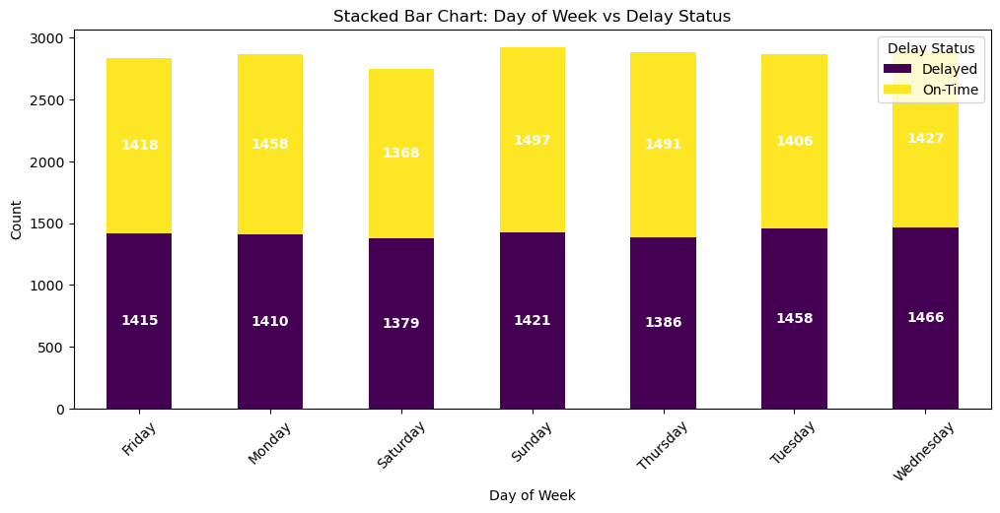

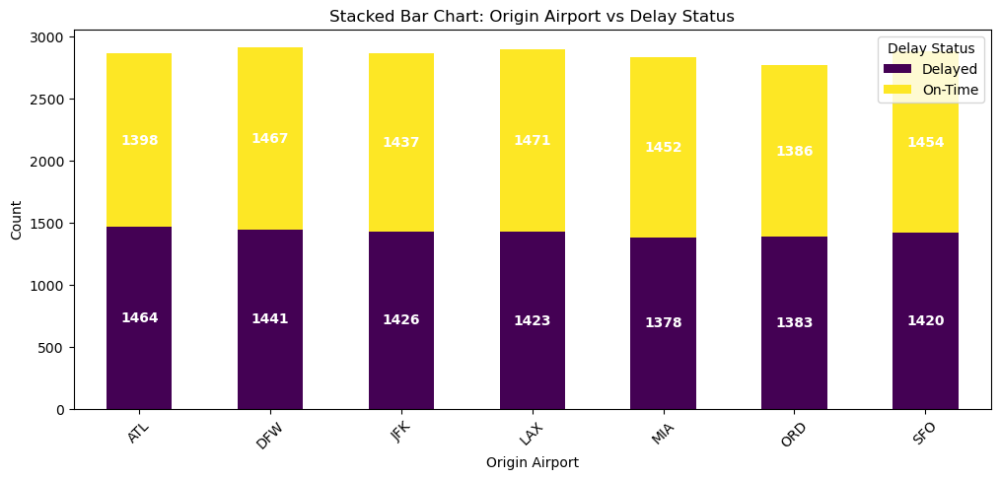

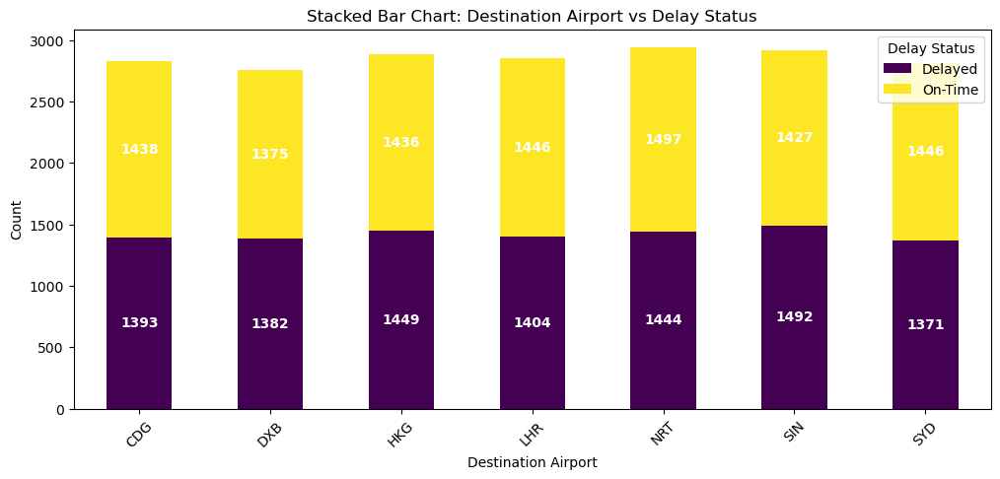

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Function to create stacked bar charts with annotations
def stacked_bar_chart(feature):
    contingency_table = pd.crosstab(df[feature], df['Delay Status'])
    
    # Plot the stacked bar chart
    ax = contingency_table.plot(kind='bar', stacked=True, figsize=(12, 5), colormap='viridis')
    plt.title(f'Stacked Bar Chart: {feature} vs Delay Status')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title="Delay Status")

    # Annotate bars with numbers
    for bars in ax.containers:
        ax.bar_label(bars, fmt='%d', label_type='center', fontsize=10, color='white', weight='bold')

    plt.show()

# Apply to all categorical features
for feature in categorical_features:
    stacked_bar_chart(feature)





              Shipment Weight (kg)  Shipment Volume (m³)  Freight Cost (USD)  \
Delay Status                                                                   
Delayed                 506.410488             25.196742          957.292101   
On-Time                 505.528152             25.322495          955.624177   

              Transit Time (hours)  Customs Clearance Time (hours)  
Delay Status                                                        
Delayed                  37.870458                       24.057071  
On-Time                  38.050075                       24.184799  


<Axes: xlabel='Delay Status'>

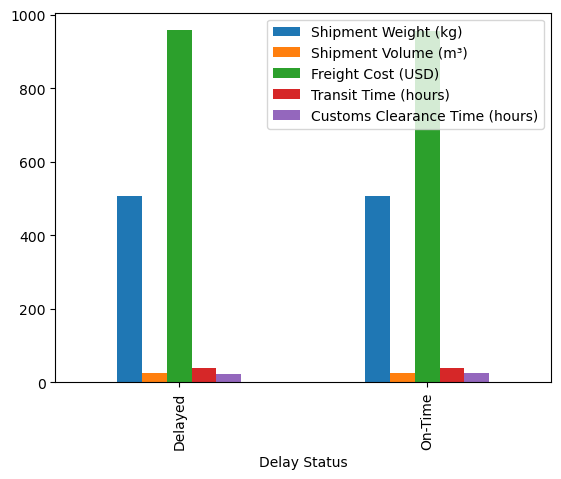

In [13]:
numerical_features = ['Shipment Weight (kg)', 'Shipment Volume (m³)', 'Freight Cost (USD)',
                      'Transit Time (hours)', 'Customs Clearance Time (hours)']
print(df.groupby('Delay Status')[numerical_features].mean())
df.groupby('Delay Status')[numerical_features].mean().plot(kind='bar')


Intreprtations:
We calculate the difference between delayed and on-time shipments for numerical features to see if they impact delays. A large difference suggests a strong influence, while a small difference means little to no effect

1.Heavier shipments slightly correlate with delays, but the difference is too small to conclude that weight is a major factor.

2.For shipment volume No strong impact on delays; in fact, delayed shipments are slightly smaller on average.

3.Freight costs shows negligible difference suggests that Freight Cost does not significantly impact shipment delays.

4.Transit time:delayed shipments have a slightly lower transit time on average.This suggests that delays are not primarily caused by longer transit durations.

5.Customs processing time is not a major factor in delays.

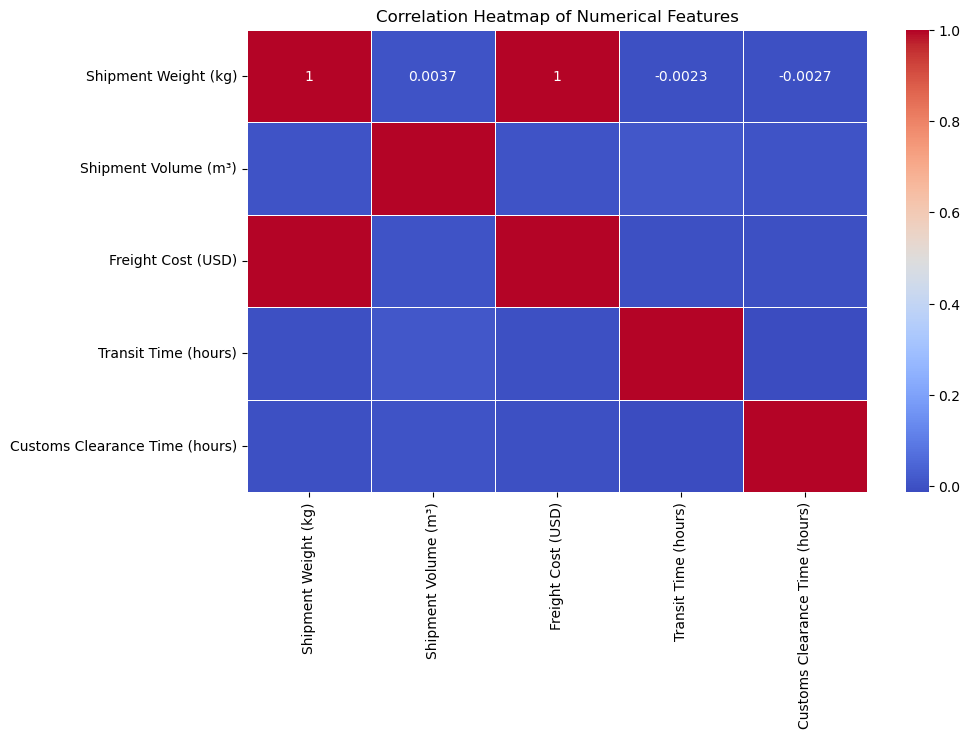

In [14]:
# Numerical correlation with Delay Status
df_corr = df.corr(numeric_only=True)
plt.figure(figsize=(10, 6))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [15]:
df.drop(columns=["Shipment ID"],inplace=True)
df

,Origin Airport,Destination Airport,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Mode of Transport,Carrier Name,Transit Time (hours),Temperature-Sensitive,Perishable Goods,Customs Clearance Time (hours),Weather Conditions,Day of Week,Delay Status
0,SFO,LHR,655.03,7.80,1238.23,Air,UPS,16,No,Yes,7,Clear,Thursday,Delayed
1,ATL,SIN,988.60,37.41,1868.80,Air,Lufthansa Cargo,21,No,No,5,Clear,Thursday,On-Time
2,DFW,HKG,637.71,10.53,1205.49,Air,FedEx,6,No,No,36,Clear,Wednesday,On-Time
3,SFO,DXB,367.47,7.70,694.65,Rail,DHL,17,Yes,No,16,Rainy,Sunday,On-Time
4,ORD,HKG,671.23,3.59,1268.86,Air,DHL,36,No,No,3,Rainy,Friday,Delayed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,ATL,DXB,158.99,10.97,300.55,Air,UPS,36,Yes,Yes,32,Clear,Monday,Delayed
19996,MIA,NRT,655.74,42.92,1239.58,Air,FedEx,46,Yes,No,28,Foggy,Friday,On-Time
19997,LAX,LHR,711.80,29.54,1345.55,Air,UPS,30,Yes,No,16,Clear,Monday,On-Time
19998,DFW,HKG,147.04,4.38,277.96,Rail,FedEx,16,No,No,19,Clear,Thursday,On-Time


C:\Users\Akhil\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])


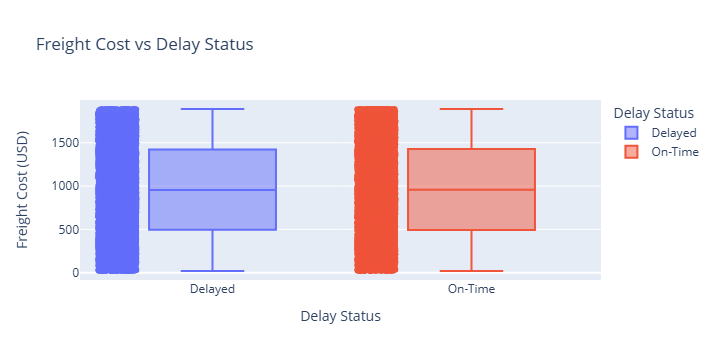

In [16]:
import plotly.express as px

fig = px.box(df, x='Delay Status', y='Freight Cost (USD)', title="Freight Cost vs Delay Status", 
             color='Delay Status', points='all')
fig.show()


C:\Users\Akhil\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



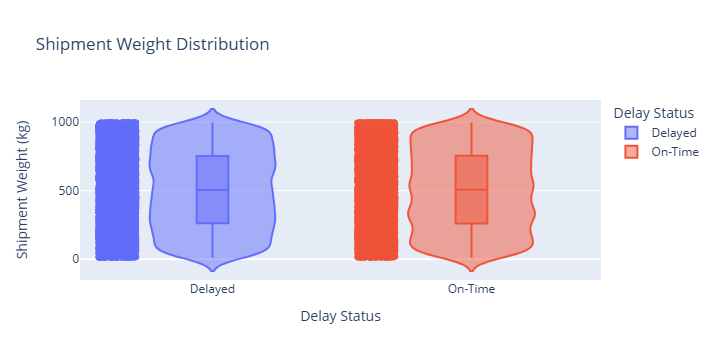

In [17]:
fig = px.violin(df, x='Delay Status', y='Shipment Weight (kg)', title="Shipment Weight Distribution",
                color='Delay Status', box=True, points="all")
fig.show()


C:\Users\Akhil\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



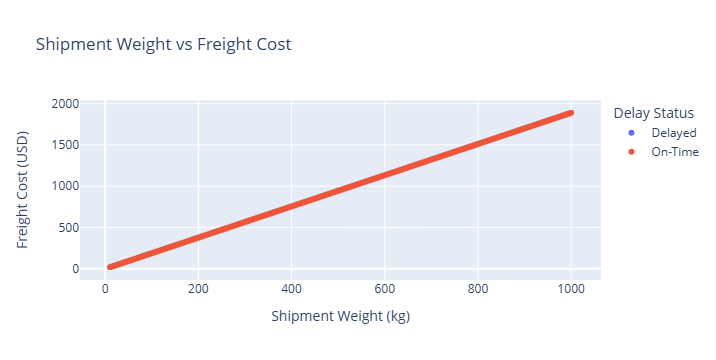

In [18]:
fig = px.scatter(df, x='Shipment Weight (kg)', y='Freight Cost (USD)', 
                 color='Delay Status', title="Shipment Weight vs Freight Cost")
fig.show()


C:\Users\Akhil\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



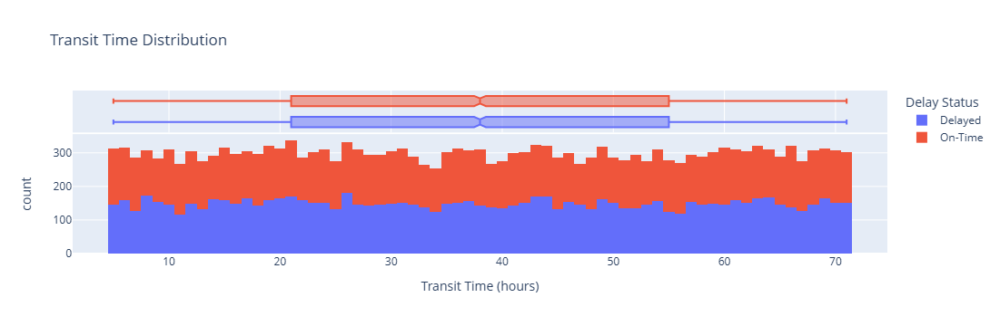

In [19]:
fig = px.histogram(df, x="Transit Time (hours)", color="Delay Status", 
                   title="Transit Time Distribution", marginal="box")
fig.show()


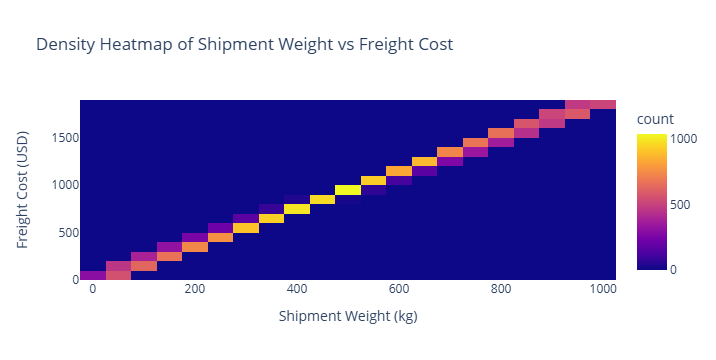

In [20]:
fig = px.density_heatmap(df, x="Shipment Weight (kg)", y="Freight Cost (USD)", 
                         title="Density Heatmap of Shipment Weight vs Freight Cost")
fig.show()



In [21]:
Origin_Airport=pd.get_dummies(df["Origin Airport"],drop_first=True)
Origin_Airport


,DFW,JFK,LAX,MIA,ORD,SFO
0,False,False,False,False,False,True
1,False,False,False,False,False,False
2,True,False,False,False,False,False
3,False,False,False,False,False,True
4,False,False,False,False,True,False
...,...,...,...,...,...,...
19995,False,False,False,False,False,False
19996,False,False,False,True,False,False
19997,False,False,True,False,False,False
19998,True,False,False,False,False,False


In [22]:
Origin_Airport=Origin_Airport.astype(int)
Origin_Airport

,DFW,JFK,LAX,MIA,ORD,SFO
0,0,0,0,0,0,1
1,0,0,0,0,0,0
2,1,0,0,0,0,0
3,0,0,0,0,0,1
4,0,0,0,0,1,0
...,...,...,...,...,...,...
19995,0,0,0,0,0,0
19996,0,0,0,1,0,0
19997,0,0,1,0,0,0
19998,1,0,0,0,0,0


In [23]:
Destination_Airport=pd.get_dummies(df["Destination Airport"],drop_first=True)
Destination_Airport

,DXB,HKG,LHR,NRT,SIN,SYD
0,False,False,True,False,False,False
1,False,False,False,False,True,False
2,False,True,False,False,False,False
3,True,False,False,False,False,False
4,False,True,False,False,False,False
...,...,...,...,...,...,...
19995,True,False,False,False,False,False
19996,False,False,False,True,False,False
19997,False,False,True,False,False,False
19998,False,True,False,False,False,False


In [24]:
Destination_Airport=Destination_Airport.astype(int)
Destination_Airport

,DXB,HKG,LHR,NRT,SIN,SYD
0,0,0,1,0,0,0
1,0,0,0,0,1,0
2,0,1,0,0,0,0
3,1,0,0,0,0,0
4,0,1,0,0,0,0
...,...,...,...,...,...,...
19995,1,0,0,0,0,0
19996,0,0,0,1,0,0
19997,0,0,1,0,0,0
19998,0,1,0,0,0,0


In [25]:
Mode_of_Transport=pd.get_dummies(df["Mode of Transport"],drop_first=True)
Mode_of_Transport

,Rail,Truck
0,False,False
1,False,False
2,False,False
3,True,False
4,False,False
...,...,...
19995,False,False
19996,False,False
19997,False,False
19998,True,False


In [26]:
Mode_of_Transport=Mode_of_Transport.astype(int)
Mode_of_Transport

,Rail,Truck
0,0,0
1,0,0
2,0,0
3,1,0
4,0,0
...,...,...
19995,0,0
19996,0,0
19997,0,0
19998,1,0


In [27]:
Temperature_Sensitive=pd.get_dummies(df["Temperature-Sensitive"],drop_first=True)
Temperature_Sensitive

,Yes
0,False
1,False
2,False
3,True
4,False
...,...
19995,True
19996,True
19997,True
19998,False


In [28]:
Temperature_Sensitive=Temperature_Sensitive.astype(int)
Temperature_Sensitive

,Yes
0,0
1,0
2,0
3,1
4,0
...,...
19995,1
19996,1
19997,1
19998,0


In [29]:
Weather_Conditions=pd.get_dummies(df["Weather Conditions"],drop_first=True)
Weather_Conditions

,Foggy,Rainy,Stormy
0,False,False,False
1,False,False,False
2,False,False,False
3,False,True,False
4,False,True,False
...,...,...,...
19995,False,False,False
19996,True,False,False
19997,False,False,False
19998,False,False,False


In [30]:
Weather_Conditions=Weather_Conditions.astype(int)
Weather_Conditions

,Foggy,Rainy,Stormy
0,0,0,0
1,0,0,0
2,0,0,0
3,0,1,0
4,0,1,0
...,...,...,...
19995,0,0,0
19996,1,0,0
19997,0,0,0
19998,0,0,0


In [31]:
delay_status=pd.get_dummies(df["Delay Status"],drop_first=True)
delay_status


,On-Time
0,False
1,True
2,True
3,True
4,False
...,...
19995,False
19996,True
19997,True
19998,True


In [32]:
delay_status=delay_status.astype(int)
delay_status

,On-Time
0,0
1,1
2,1
3,1
4,0
...,...
19995,0
19996,1
19997,1
19998,1


In [33]:
carrier_name=pd.get_dummies(df["Carrier Name"],drop_first=True)
carrier_name

,Emirates Cargo,FedEx,Lufthansa Cargo,UPS
0,False,False,False,True
1,False,False,True,False
2,False,True,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
19995,False,False,False,True
19996,False,True,False,False
19997,False,False,False,True
19998,False,True,False,False


In [34]:
carrier_name=carrier_name.astype(int)
carrier_name

,Emirates Cargo,FedEx,Lufthansa Cargo,UPS
0,0,0,0,1
1,0,0,1,0
2,0,1,0,0
3,0,0,0,0
4,0,0,0,0
...,...,...,...,...
19995,0,0,0,1
19996,0,1,0,0
19997,0,0,0,1
19998,0,1,0,0


In [35]:
dayoftheweek=pd.get_dummies(df["Day of Week"],drop_first=True)
dayoftheweek

,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,False,False,False,True,False,False
1,False,False,False,True,False,False
2,False,False,False,False,False,True
3,False,False,True,False,False,False
4,False,False,False,False,False,False
...,...,...,...,...,...,...
19995,True,False,False,False,False,False
19996,False,False,False,False,False,False
19997,True,False,False,False,False,False
19998,False,False,False,True,False,False


In [36]:
dayoftheweek=dayoftheweek.astype(int)
dayoftheweek

,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,0,0,0,1,0,0
1,0,0,0,1,0,0
2,0,0,0,0,0,1
3,0,0,1,0,0,0
4,0,0,0,0,0,0
...,...,...,...,...,...,...
19995,1,0,0,0,0,0
19996,0,0,0,0,0,0
19997,1,0,0,0,0,0
19998,0,0,0,1,0,0


In [37]:
perishablegoods=pd.get_dummies(df["Perishable Goods"],drop_first=True)
perishablegoods

,Yes
0,True
1,False
2,False
3,False
4,False
...,...
19995,True
19996,False
19997,False
19998,False


In [38]:
perishablegoods=perishablegoods.astype(int)
perishablegoods

,Yes
0,1
1,0
2,0
3,0
4,0
...,...
19995,1
19996,0
19997,0
19998,0


In [39]:
df.drop(columns=["Origin Airport", "Destination Airport", "Mode of Transport", "Temperature-Sensitive","Carrier Name","Weather Conditions","Delay Status","Day of Week","Perishable Goods"],inplace=True)
df

,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Transit Time (hours),Customs Clearance Time (hours)
0,655.03,7.80,1238.23,16,7
1,988.60,37.41,1868.80,21,5
2,637.71,10.53,1205.49,6,36
3,367.47,7.70,694.65,17,16
4,671.23,3.59,1268.86,36,3
...,...,...,...,...,...
19995,158.99,10.97,300.55,36,32
19996,655.74,42.92,1239.58,46,28
19997,711.80,29.54,1345.55,30,16
19998,147.04,4.38,277.96,16,19


In [40]:
df=pd.concat([df,Origin_Airport
,Destination_Airport,
Mode_of_Transport,
Temperature_Sensitive,
Weather_Conditions,
delay_status,carrier_name,dayoftheweek,perishablegoods],axis=1)
df


,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Transit Time (hours),Customs Clearance Time (hours),DFW,JFK,LAX,MIA,ORD,...,FedEx,Lufthansa Cargo,UPS,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,Yes
0,655.03,7.80,1238.23,16,7,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
1,988.60,37.41,1868.80,21,5,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
2,637.71,10.53,1205.49,6,36,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
3,367.47,7.70,694.65,17,16,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,671.23,3.59,1268.86,36,3,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,158.99,10.97,300.55,36,32,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,1
19996,655.74,42.92,1239.58,46,28,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
19997,711.80,29.54,1345.55,30,16,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
19998,147.04,4.38,277.96,16,19,1,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


In [41]:
from sklearn.preprocessing import MinMaxScaler

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Columns to scale
numerical_cols = [
    "Shipment Weight (kg)",
    "Shipment Volume (m³)",
    "Freight Cost (USD)",
    "Transit Time (hours)",
    "Customs Clearance Time (hours)"
]

# Apply Min-Max Scaling
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Display first few rows
df.head()


,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Transit Time (hours),Customs Clearance Time (hours),DFW,JFK,LAX,MIA,ORD,...,FedEx,Lufthansa Cargo,UPS,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday,Yes
0,0.651558,0.154340,0.651556,0.166667,0.130435,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,1
1,0.988515,0.747845,0.988516,0.242424,0.086957,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
2,0.634062,0.209060,0.634061,0.015152,0.760870,1,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0
3,0.361079,0.152335,0.361082,0.181818,0.326087,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0.667923,0.069954,0.667924,0.469697,0.043478,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


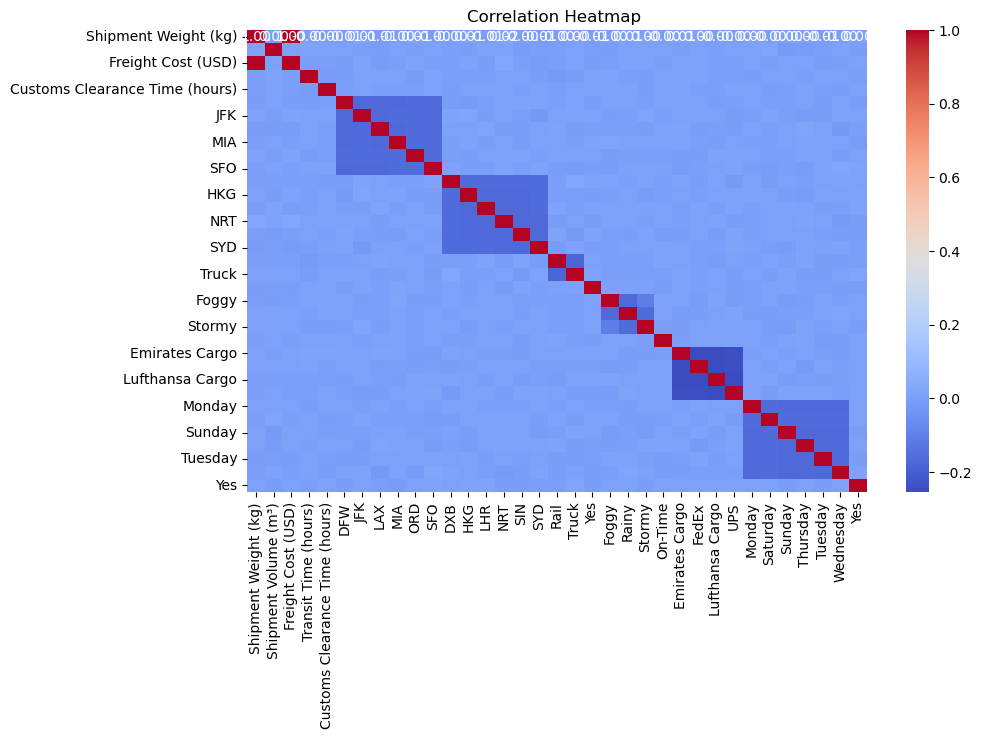

In [42]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap ")
plt.show()

Intrpetation:

1.No single feature strongly impacts another.

2.No strong positive or negative relationships exist in the dataset, as most values are close to 0 (blue regions).

3.Features appear mostly independent, meaning no direct relationship significantly affects shipment delays.

In [43]:
df = df.drop(columns=['Yes'], errors='ignore')


In [44]:
x=df.drop("On-Time",axis=1)
y=df["On-Time"]

In [45]:
x

,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Transit Time (hours),Customs Clearance Time (hours),DFW,JFK,LAX,MIA,ORD,...,Emirates Cargo,FedEx,Lufthansa Cargo,UPS,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,0.651558,0.154340,0.651556,0.166667,0.130435,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
1,0.988515,0.747845,0.988516,0.242424,0.086957,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
2,0.634062,0.209060,0.634061,0.015152,0.760870,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,1
3,0.361079,0.152335,0.361082,0.181818,0.326087,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0.667923,0.069954,0.667924,0.469697,0.043478,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0.150482,0.217879,0.150485,0.469697,0.673913,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
19996,0.652275,0.858288,0.652278,0.621212,0.586957,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0
19997,0.708904,0.590098,0.708905,0.378788,0.326087,0,0,1,0,0,...,0,0,0,1,1,0,0,0,0,0
19998,0.138411,0.085789,0.138413,0.166667,0.391304,1,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0


In [46]:
y

0        0
1        1
2        1
3        1
4        0
        ..
19995    0
19996    1
19997    1
19998    1
19999    1
Name: On-Time, Length: 20000, dtype: int32

In [47]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.15,random_state=15)

In [48]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
# Train Logistic Regression Model
log_reg = LogisticRegression()
log_reg.fit(x_train, y_train)

# Predictions and Evaluation
y_pred = log_reg.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Logistic Regression Accuracy: {accuracy:.4f}")
# Print Classification Report
print("Classification Report:\n", classification_report(y_test, y_pred))

Logistic Regression Accuracy: 0.5153
Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.45      0.48      1478
           1       0.52      0.58      0.55      1522

    accuracy                           0.52      3000
   macro avg       0.51      0.51      0.51      3000
weighted avg       0.51      0.52      0.51      3000



In [49]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
# Create and train the Decision Tree model
dt_classifier = DecisionTreeClassifier(criterion='entropy', max_depth=11, min_samples_split=2,random_state=44)
#Gini criterion, max depth 11, and minimum 3 samples required to split a node.
dt_classifier.fit(x_train, y_train)
# Trains (fits) the Decision Tree model using the training data (x_train, y_train).
# Make predictions
y_pred = dt_classifier.predict(x_test) #Uses the trained model to predict labels for the test dataset (x_test).

# Evaluate the model
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')
print("Classification report of Decision Tree Classifier Model")
print(classification_report(y_test, y_pred))

Accuracy: 0.53
Classification report of Decision Tree Classifier Model
              precision    recall  f1-score   support

           0       0.53      0.37      0.44      1478
           1       0.52      0.67      0.59      1522

    accuracy                           0.53      3000
   macro avg       0.53      0.52      0.51      3000
weighted avg       0.53      0.53      0.51      3000



In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Function to plot Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["On Time", "Delayed"], yticklabels=["On Time", "Delayed"])
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {model_name}")
    plt.show()


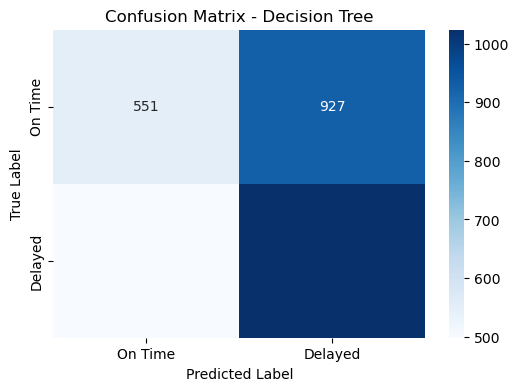

In [51]:
plot_confusion_matrix(y_test, y_pred, "Decision Tree")


In [52]:
from sklearn.ensemble import RandomForestClassifier

Accuracy: 0.52

Classification Report:
               precision    recall  f1-score   support

           0       0.51      0.55      0.53      1478
           1       0.52      0.49      0.51      1522

    accuracy                           0.52      3000
   macro avg       0.52      0.52      0.52      3000
weighted avg       0.52      0.52      0.52      3000



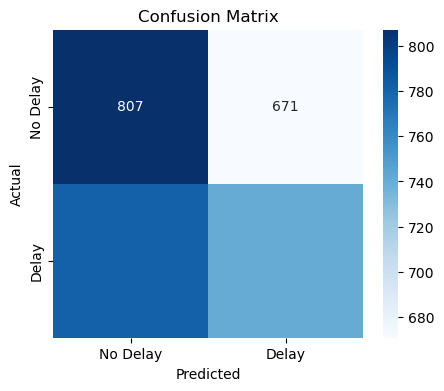

In [53]:
model = RandomForestClassifier(n_estimators=44, random_state=54)
model.fit(x_train, y_train)

# 🔹 Make predictions
y_pred = model.predict(x_test)

# 🔹 Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# 🔹 Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=["No Delay", "Delay"], yticklabels=["No Delay", "Delay"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [54]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Initialize Base Learner (Weak Learner)
base_clf = DecisionTreeClassifier(max_depth=1)

# Train AdaBoost Classifier
ada_clf = AdaBoostClassifier( n_estimators=54, learning_rate=1.8)
ada_clf.fit(x_train, y_train)

# Predictions and Evaluation
y_pred = ada_clf.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"AdaBoost Accuracy: {accuracy:.4f}")


AdaBoost Accuracy: 0.5137


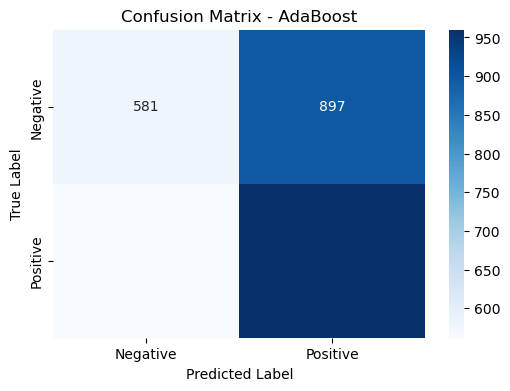

In [55]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"])
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - AdaBoost")
plt.show()

In [56]:
import xgboost as xgb
from xgboost import XGBClassifier
# Train an XGBoost Classifier
model = xgb.XGBClassifier(n_estimators=90, learning_rate=0.01, max_depth=18)
model.fit(x_train, y_train)
#Log Loss measures how well a classification model predicts probabilities of the correct class.
# Make predictions
y_pred = model.predict(x_test)

# Model evaluation
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.51

Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.48      0.49      1478
           1       0.51      0.54      0.53      1522

    accuracy                           0.51      3000
   macro avg       0.51      0.51      0.51      3000
weighted avg       0.51      0.51      0.51      3000



AdaBoost:Improves on misclassified data, useful if your dataset has  weak features.
XGBoost:Works better for large, complex data, handles missing values, and prevents overfitting.

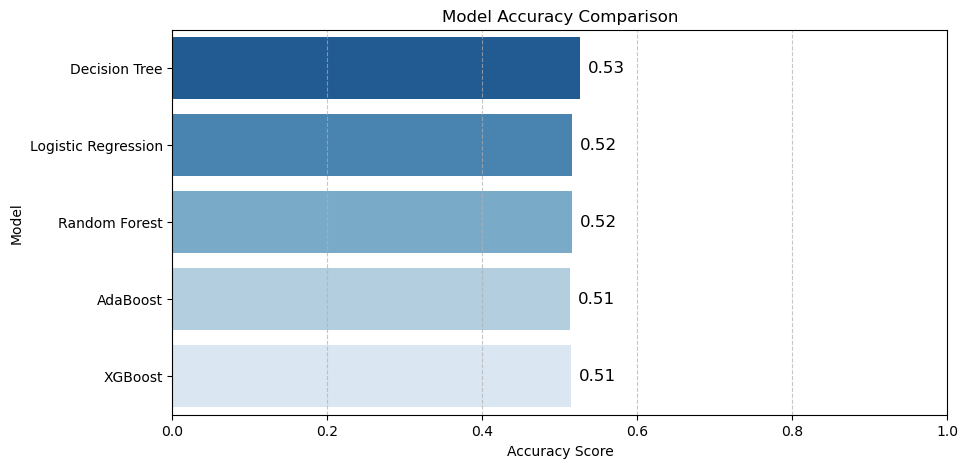

In [57]:


# Define models
models = {
    "Decision Tree": DecisionTreeClassifier(criterion='entropy', max_depth=11, min_samples_split=3, random_state=54),
    "Logistic Regression": LogisticRegression(),
    "Random Forest": RandomForestClassifier(n_estimators=44, random_state=54),
     "AdaBoost": AdaBoostClassifier(n_estimators=54, learning_rate=1.8),
    "XGBoost": XGBClassifier(n_estimators=90, learning_rate=0.01, max_depth=20)

}

# Train and evaluate models
accuracy_results = {}
for name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    accuracy_results[name] = accuracy_score(y_test, y_pred)

# Convert to DataFrame
accuracy_df = pd.DataFrame(list(accuracy_results.items()), columns=['Model', 'Accuracy'])

# Plot bar chart
plt.figure(figsize=(10, 5))
sns.barplot(x='Accuracy', y='Model', data=accuracy_df, palette='Blues_r')
plt.xlabel("Accuracy Score")
plt.ylabel("Model")
plt.title("Model Accuracy Comparison")
plt.xlim(0, 1)  # Accuracy is between 0 and 1
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show accuracy values on bars
for index, value in enumerate(accuracy_df["Accuracy"]):
    plt.text(value + 0.01, index, f"{value:.2f}", va="center", fontsize=12)

plt.show()


In [58]:
import statsmodels.api as sm
x_train_ols = sm.add_constant(x_train)  
ols_model = sm.OLS(y_train, x_train_ols).fit()
p_value_threshold = 0.05
while True:
    p_values = ols_model.pvalues
    max_p_value = p_values.max()  
    if max_p_value > p_value_threshold:
        feature_to_remove = p_values.idxmax()  
        x_train_ols = x_train_ols.drop(columns=[feature_to_remove])
        ols_model = sm.OLS(y_train, x_train_ols).fit() 
    else:
        break
selected_features = x_train_ols.columns.tolist()
print("Selected Features:", selected_features)

Selected Features: ['const']


In [59]:
df.corr()

,Shipment Weight (kg),Shipment Volume (m³),Freight Cost (USD),Transit Time (hours),Customs Clearance Time (hours),DFW,JFK,LAX,MIA,ORD,...,Emirates Cargo,FedEx,Lufthansa Cargo,UPS,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
Shipment Weight (kg),1.000000,0.003696,1.000000,-0.002268,-0.002734,-0.009753,0.010101,-0.014392,-0.001296,0.010055,...,0.005519,0.001239,-0.000985,-0.003330,0.002512,-0.002235,0.000256,0.000299,-0.006017,-0.002616
Shipment Volume (m³),0.003696,1.000000,0.003696,0.011668,0.006357,-0.000090,-0.002418,-0.005401,0.000682,-0.002163,...,-0.001034,0.000310,-0.001144,0.002098,0.003856,0.018829,-0.019169,-0.013609,-0.002833,0.006276
Freight Cost (USD),1.000000,0.003696,1.000000,-0.002268,-0.002734,-0.009753,0.010101,-0.014391,-0.001296,0.010055,...,0.005519,0.001239,-0.000985,-0.003330,0.002512,-0.002235,0.000256,0.000299,-0.006017,-0.002616
Transit Time (hours),-0.002268,0.011668,-0.002268,1.000000,-0.012764,-0.006196,0.008545,0.004731,0.003124,-0.012225,...,0.010189,0.007967,-0.003439,-0.000229,-0.005516,0.001987,0.001760,-0.002336,0.002611,0.004160
Customs Clearance Time (hours),-0.002734,0.006357,-0.002734,-0.012764,1.000000,-0.002248,-0.000089,-0.003818,-0.001846,-0.004250,...,0.011287,-0.000530,-0.002986,0.006383,0.004420,-0.008222,-0.001161,0.009384,-0.002554,-0.005264
DFW,-0.009753,-0.000090,-0.009753,-0.006196,-0.002248,1.000000,-0.168595,-0.169659,-0.167459,-0.165351,...,0.006773,0.001434,-0.009485,-0.002852,0.002021,-0.001819,-0.001317,0.004723,-0.006651,0.004983
JFK,0.010101,-0.002418,0.010101,0.008545,-0.000089,-0.168595,1.000000,-0.168120,-0.165940,-0.163851,...,0.003645,0.002139,0.002913,-0.010117,-0.004299,0.011516,-0.002310,-0.013768,-0.007736,0.014557
LAX,-0.014392,-0.005401,-0.014391,0.004731,-0.003818,-0.169659,-0.168120,1.000000,-0.166987,-0.164885,...,0.014516,-0.006476,-0.001097,-0.007241,0.007300,-0.000616,0.002321,0.016482,0.003887,-0.020856
MIA,-0.001296,0.000682,-0.001296,0.003124,-0.001846,-0.167459,-0.165940,-0.166987,1.000000,-0.162747,...,0.008188,-0.001964,-0.006052,0.002647,-0.001155,-0.003209,0.004106,0.005275,0.000714,0.001485
ORD,0.010055,-0.002163,0.010055,-0.012225,-0.004250,-0.165351,-0.163851,-0.164885,-0.162747,1.000000,...,-0.008940,-0.005202,0.010932,0.007401,0.001621,-0.004341,-0.004100,0.006881,0.009704,-0.010098


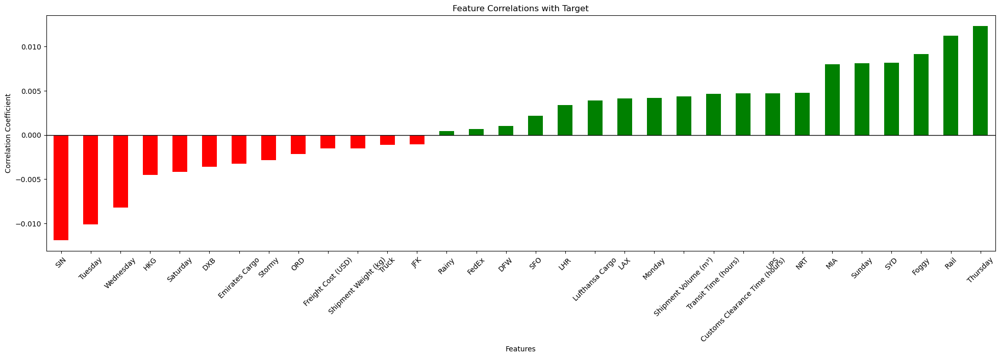

In [60]:
import pandas as pd
import matplotlib.pyplot as plt


# Compute correlation with target variable (replace 'target' with actual column name)
target_variable = 'On-Time'  # Update this with your actual target column name
correlations = df.corr()[target_variable].drop(target_variable)

# Sort correlations
correlations = correlations.sort_values()

# Plot bar chart
plt.figure(figsize=(24, 6))
correlations.plot(kind='bar', color=['red' if x < 0 else 'green' for x in correlations])
plt.axhline(y=0, color='black', linewidth=1)
plt.title('Feature Correlations with Target')
plt.ylabel('Correlation Coefficient')
plt.xlabel('Features')
plt.xticks(rotation=45)
plt.show()


Interpretation:

->All feature correlations with the target variable are very close to zero suggesting that none of the features strongly influence the target variable, leading to poor predictive performance.

->Features like Thursday, Rail, Foggy, Sunday, SYD, and MIA have slightly positive correlation with the target.This means that when these features increase, the target variable has a small tendency to increase (but the effect is weak).

->Features like SIN, Tuesday, Wednesday, HKG, and Saturday show a negative correlation with the target.

->Here ordinary least squares is used for best fit line which minimizes sqaured differences between actual and predicted values which help in understanding relationships between dependent and independent variables for making predictions.
